In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline


In [2]:
import os
import cv2
from tqdm import tqdm
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from skimage.io import imread
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
from skimage.measure import label, regionprops
import skimage.util._montage as montage
from fastai.vision import *
from fastai.callbacks.hooks import *
from fastai.utils.mem import *
import skimage
import warnings
import scipy
import shutil

warnings.filterwarnings("ignore")

In [3]:
gpu_mem_get_all()

[GPUMemory(total=24219, free=22829, used=1389)]

In [4]:
gpu_mem_get_free_no_cache()



22829

In [5]:
gpu_mem_get_all()

[GPUMemory(total=24219, free=22829, used=1389)]

In [6]:
path = untar_data('data/seg_data')
mask_train_path= path/'masks'
train_path = path/'images'
test_images = path/'test'

In [7]:
# From: https://forums.fast.ai/t/cant-do-segmentation-cuda-error-device-side-assert-triggered/37507/5?u=andandandand
class SegLabelListCustom(SegmentationLabelList):
    def open(self, fn): return open_mask(fn, div=True)

class SegItemListCustom(SegmentationItemList):
    _label_cls = SegLabelListCustom

In [8]:
fnames = get_image_files(train_path)
mask_names = get_image_files(mask_train_path)
gpu_mem_get_all()

[GPUMemory(total=24219, free=22829, used=1389)]

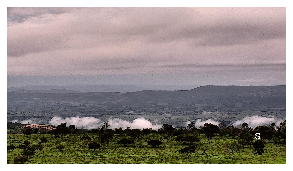

In [9]:
img_f = fnames[1]
img = open_image(img_f)
img.show(figsize=(5,5))

In [10]:
get_y_fn = lambda x :mask_train_path / str(x.stem+'.png') # Fixed


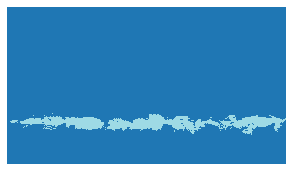

In [11]:
mask = open_mask(get_y_fn(img_f))
mask.show(figsize=(5,5), alpha=1)

In [12]:
src_size = np.array(mask.shape[1:])
gpu_mem_get_all()

[GPUMemory(total=24219, free=22829, used=1389)]

In [13]:
src_size = np.array(mask.shape[1:])
gpu_mem_get_all()

[GPUMemory(total=24219, free=22829, used=1389)]

In [14]:
codes =['No-Smoke', 'smoke']

In [15]:
image_size= 256
size = [image_size,image_size]
#size =224
print(size)

[256, 256]


In [16]:
bs = 64

In [17]:
gpu_mem_get_all()

[GPUMemory(total=24219, free=22829, used=1389)]

In [18]:
free = gpu_mem_get_free_no_cache()
data = (SegItemListCustom.from_folder(train_path)
        .split_by_rand_pct()
        .label_from_func(get_y_fn, classes=codes)
        .transform(get_transforms(), tfm_y=True, size=size)
        .databunch(bs=bs).normalize(imagenet_stats))

In [19]:
def dice_(input:Tensor, targs:Tensor, iou:bool=True, eps:float=1e-8)->Rank0Tensor:
    n = targs.shape[0]
    dice_sum = torch.as_tensor([0.], dtype=torch.float32, device=targs.device)
    for i in range(1, targs.max()+1):
        input_flatten = input[:,i-1,:,:].flatten(1,-1).float()
        targs_flatten = targs.flatten(1,-1).float()
        input_flatten[input_flatten>0.5], input_flatten[input_flatten<=0.5] = 1., 0.
        targs_flatten[targs_flatten!=i], targs_flatten[targs_flatten==i] = 0, 1
        intersect = (input_flatten * targs_flatten).sum(dim=1)
        union = (input_flatten + targs_flatten).sum(dim=1)
        if not iou: l = 2. * intersect / union
        else: l = intersect / (union-intersect+eps)
        l[union == 0.] = 1
        dice_sum += l.mean()
    return dice_sum / targs.max()

In [20]:
learn = unet_learner(data, models.resnet34, metrics=[dice],self_attention = True, wd=1e-2)
learn.to_fp16();

learn.load('stage-2_res34')

Learner(data=ImageDataBunch;

Train: LabelList (6911 items)
x: SegItemListCustom
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegLabelListCustom
ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256)
Path: /home/sahand/Smoke_detection/data/seg_data/images;

Valid: LabelList (1727 items)
x: SegItemListCustom
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: SegLabelListCustom
ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256),ImageSegment (1, 256, 256)
Path: /home/sahand/Smoke_detection/data/seg_data/images;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_run

In [21]:
learn.export()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.16E-05
Min loss divided by 10: 8.32E-04


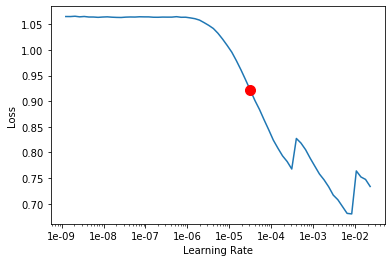

In [20]:
learn = unet_learner(data, models.resnet34, metrics=[dice],self_attention = True, wd=1e-2)
learn.to_fp16();

#learn.load('stage-2_res34')
lr_find(learn,start_lr=1e-10, end_lr=10, num_it=100, stop_div=True, wd=1e-2)
learn.recorder.plot(suggestion=True)


In [21]:

learn.fit_one_cycle(10, slice(1e-3))

epoch,train_loss,valid_loss,dice,time
0,0.114880,0.090305,0.598349,02:13
1,0.091959,0.082046,0.692611,02:08
2,0.085036,0.073763,0.743964,02:08
3,0.080357,0.073302,0.726673,02:08
4,0.078677,0.067357,0.735798,02:08
5,0.071318,0.083210,0.747602,02:09
6,0.068656,0.067890,0.764730,02:09
7,0.064946,0.067048,0.748437,02:07
8,0.060305,0.066749,0.763082,02:08
9,0.058421,0.066114,0.767960,02:08


In [22]:
learn.save('stage-1_res34')

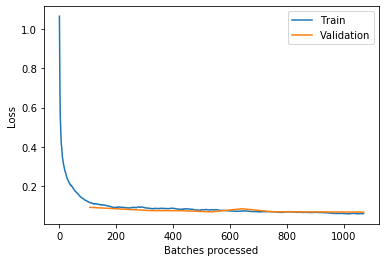

In [23]:
learn.recorder.plot_losses()

In [ ]:
gpu_mem_get_all()

In [24]:
#learn = unet_learner(data, models.resnet34, metrics=[dice_], wd=1e-2)
#learn = unet_learner(data, models.resnet34, metrics=[dice],self_attention = True, wd=1e-2)
#learn.load('stage-1_res34_224')
learn.unfreeze()
lr_find(learn,start_lr=1e-10, end_lr=10, num_it=100, stop_div=True, wd=1e-1)


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 1.55E-07
Min loss divided by 10: 1.26E-10


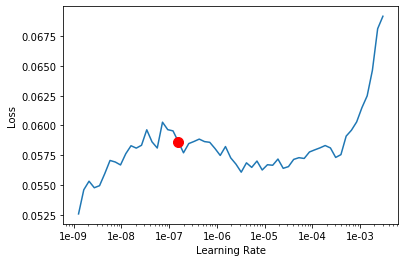

In [25]:
learn.recorder.plot(suggestion=True)


In [26]:

learn.fit_one_cycle(2, slice(1.55E-07,2e-06))

epoch,train_loss,valid_loss,dice,time
0,0.059694,0.066039,0.767472,02:09
1,0.056553,0.066036,0.768569,02:08


In [28]:
learn.save('stage-2_res34')

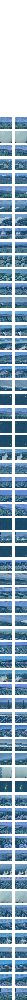

In [29]:
learn.show_results(rows =100)

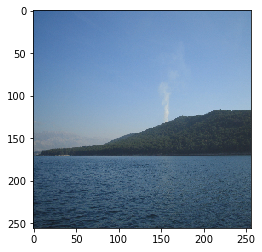

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


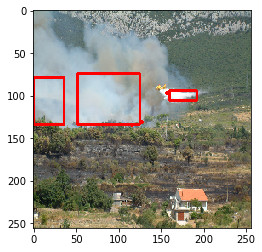

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


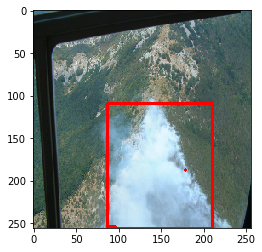

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


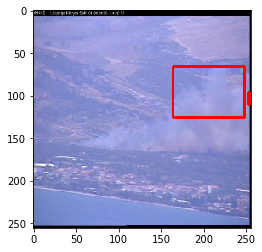

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


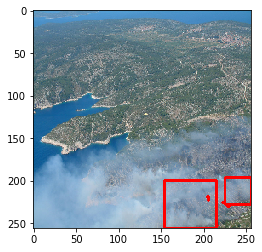

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


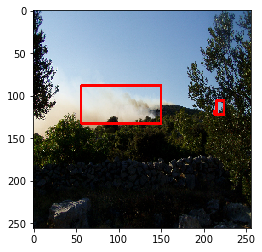

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


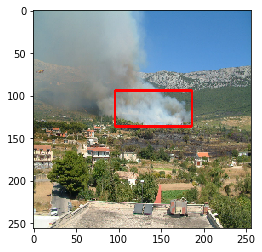

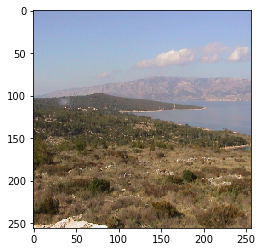

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


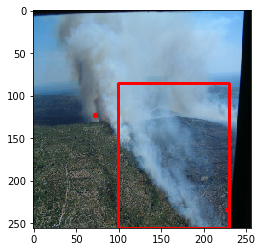

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


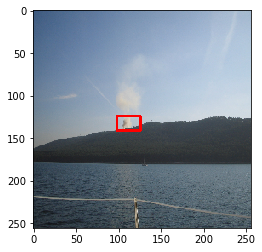

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


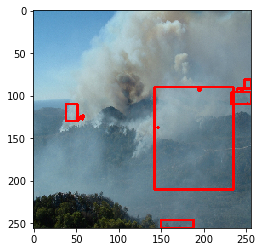

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


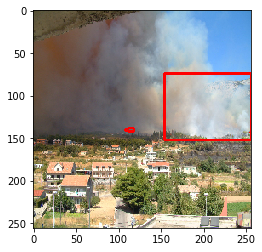

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


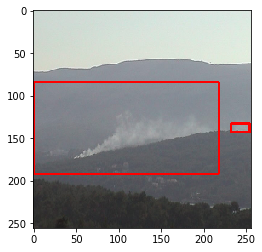

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


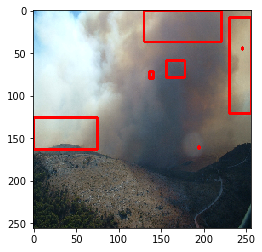

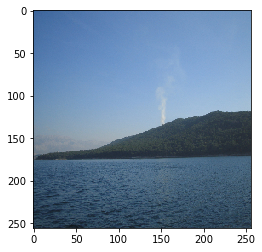

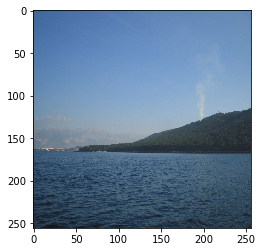

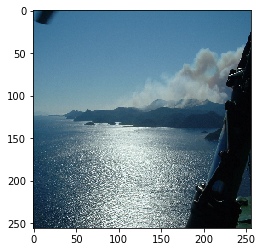

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


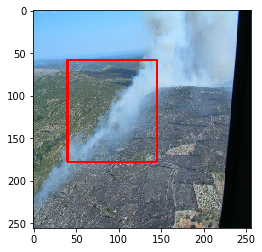

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


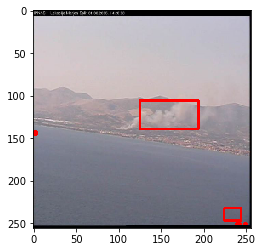

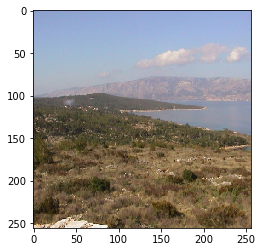

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


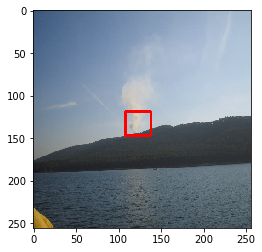

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


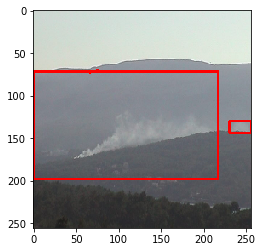

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


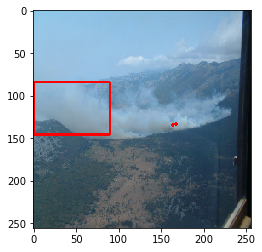

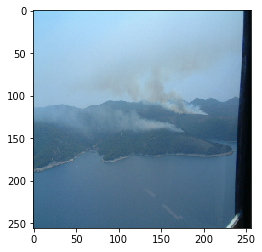

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


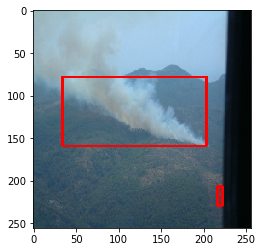

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


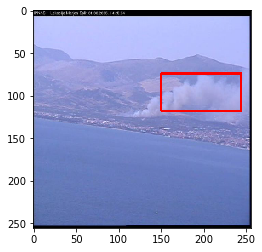

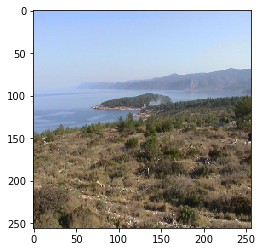

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


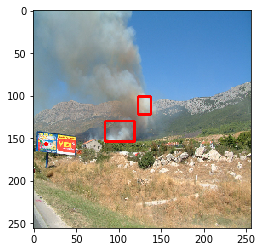

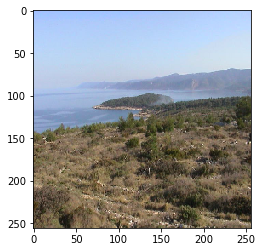

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


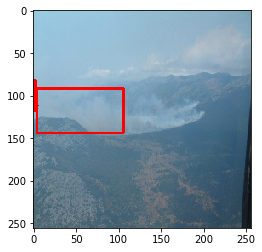

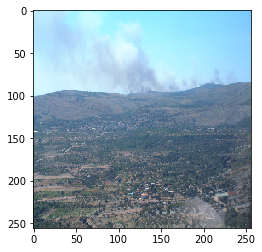

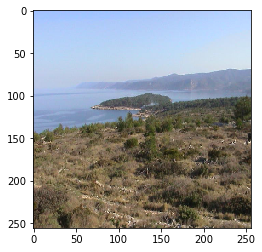

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


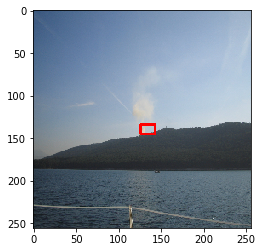

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


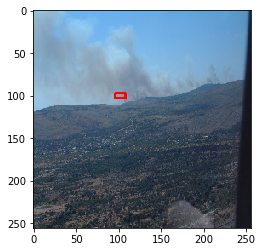

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


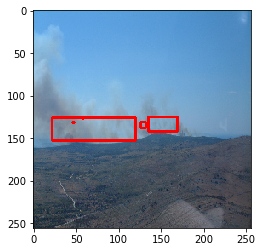

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


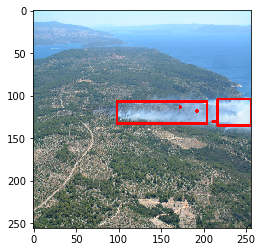

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


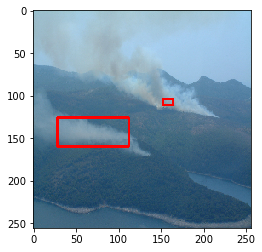

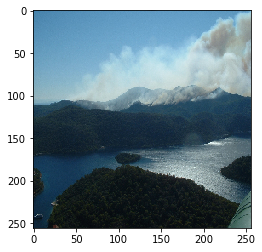

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


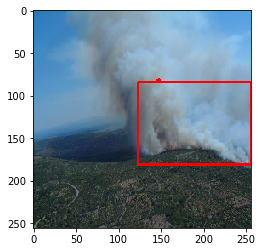

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


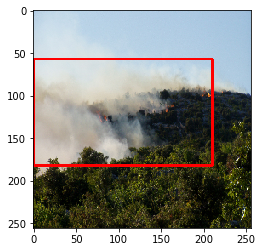

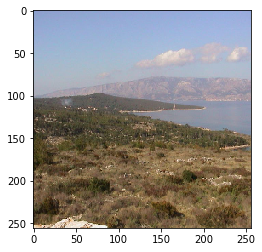

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


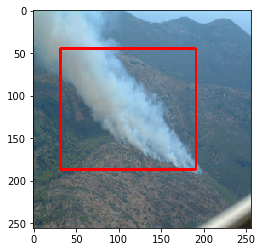

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


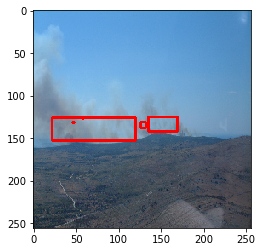

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


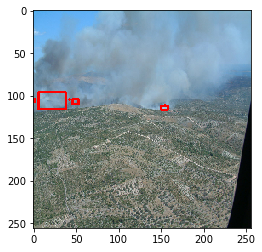

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


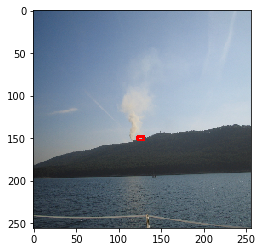

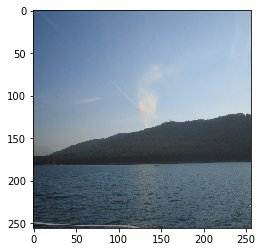

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


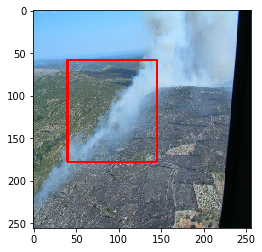

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


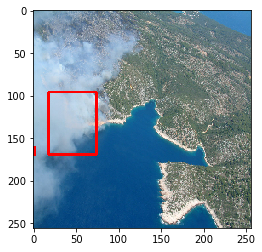

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


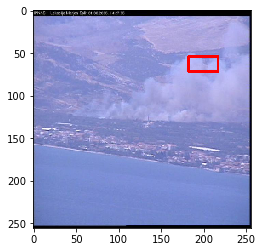

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


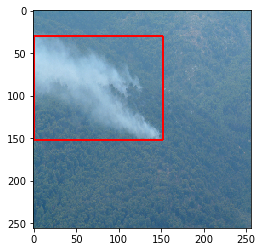

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


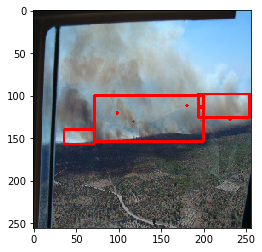

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


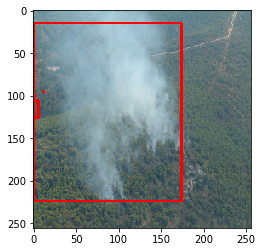

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


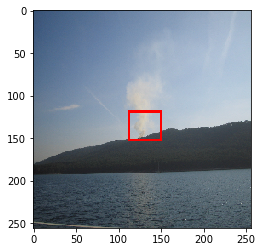

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


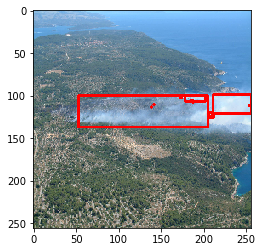

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


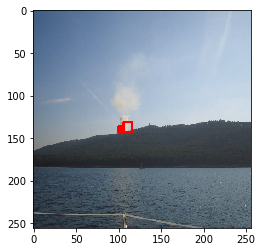

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


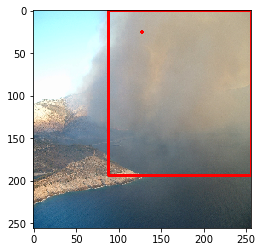

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


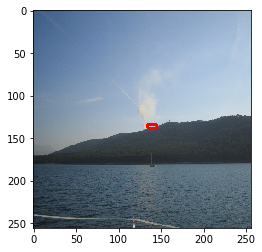

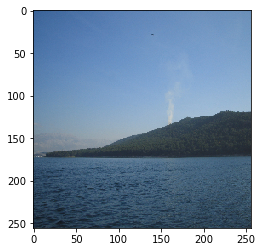

In [30]:
omdena_test_images='data/seg_data/test'

    
test_names=get_image_files(omdena_test_images)


predicted_masks=[]

for i in range(len(test_names)):
    
    img = open_image(test_names[i])
    predicted_mask=learn.predict(img)
    mask = predicted_mask[0].data.numpy().transpose((1, -1, 0))
    lbl_0 = label(mask)
    props = regionprops(lbl_0)
    img_0=cv2.resize(img.data.numpy().transpose((1, -1, 0)), (image_size, image_size)).reshape(mask.shape[0], mask.shape[1],3)
    img_1 = img_0.copy()
    for prop in props:
        cv2.rectangle(img_1, (prop.bbox[1], prop.bbox[0]), (prop.bbox[4], prop.bbox[3]),(255, 0, 0), 2)
    plt.imshow(img_1)

    plt.show()